<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/Python_Learning_%26_Exam_Performance_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Python Learning & Exam Performance Dataset

# About the dataset

This dataset comprises 3000 entries and 15 features, detailing students' Python learning habits and exam performance. It includes numerical attributes such as age, weeks_in_course, hours_spent_learning_per_week, practice_problems_solved, projects_completed, tutorial_videos_watched, debugging_sessions_per_week, self_reported_confidence_python, and final_exam_score, alongside categorical features like country and prior_programming_experience.

A notable observation is the presence of 1062 missing values in the prior_programming_experience column, suggesting that this information was not collected for a significant portion of students or is unknown. The dataset is global, with students from Brazil, Germany, and India being the most represented countries. The prior_programming_experience category is dominated by 'Beginner' students, followed by 'Intermediate' and then 'Advanced'.

Key insights from the numerical features reveal varying distributions. For instance, hours_spent_learning_per_week ranges from 0 to 17.1, with a mean of around 7 hours, indicating diverse study commitments. Similarly, practice_problems_solved and tutorial_videos_watched also show a wide range, reflecting different engagement levels with learning resources.

Crucially, the final_exam_score ranges from 0 to 100, with a mean of approximately 43.3. The passed_exam column (a binary indicator) shows that only about 17.7% of students passed, highlighting a challenging exam or a diverse skill set among participants.

Correlation analysis suggests positive relationships between study effort metrics (e.g., weeks_in_course, hours_spent_learning_per_week, practice_problems_solved, projects_completed, tutorial_videos_watched, debugging_sessions_per_week, self_reported_confidence_python) and final_exam_score, which, in turn, is strongly correlated with passed_exam. This implies that dedicated engagement with learning activities generally leads to better performance. Further investigation into the impact of country and prior_programming_experience on final_exam_score could uncover interesting regional or experience-based learning patterns.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d emonsharkar/python-learning-and-exam-performance-dataset

# Unziping the downloaded file
!unzip python-learning-and-exam-performance-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/emonsharkar/python-learning-and-exam-performance-dataset
License(s): CC-BY-SA-4.0
  0% 0.00/47.8k [00:00<?, ?B/s]
100% 47.8k/47.8k [00:00<00:00, 149MB/s]
Archive:  python-learning-and-exam-performance-dataset.zip
  inflating: python_learning_exam_performance.csv  


In [3]:
df = pd.read_csv('python_learning_exam_performance.csv')
df.head(11)

,student_id,age,country,prior_programming_experience,weeks_in_course,hours_spent_learning_per_week,practice_problems_solved,projects_completed,tutorial_videos_watched,uses_kaggle,participates_in_discussion_forums,debugging_sessions_per_week,self_reported_confidence_python,final_exam_score,passed_exam
0,1,54,Pakistan,Beginner,12,12.2,60,1,24,0,1,4,10,53.8,0
1,2,44,Nigeria,NaN,15,14.2,52,1,32,0,0,5,7,31.9,0
2,3,30,India,Intermediate,5,7.7,71,1,43,0,0,6,3,59.4,0
3,4,23,Nigeria,Beginner,4,5.6,64,2,40,1,0,3,10,58.8,0
4,5,36,UK,NaN,3,3.5,62,1,47,1,0,3,7,24.8,0
5,6,54,Brazil,Intermediate,10,8.4,64,0,35,0,1,3,3,43.8,0
6,7,34,USA,NaN,1,12.3,60,1,35,0,0,5,2,40.8,0
7,8,38,Nigeria,NaN,3,6.3,56,3,41,1,1,7,1,24.7,0
8,9,26,Bangladesh,Beginner,3,0.0,52,1,26,0,0,5,6,20.7,0
9,10,26,Brazil,Beginner,7,9.0,60,1,42,1,1,6,3,45.3,0


In [4]:
df.tail(11)

,student_id,age,country,prior_programming_experience,weeks_in_course,hours_spent_learning_per_week,practice_problems_solved,projects_completed,tutorial_videos_watched,uses_kaggle,participates_in_discussion_forums,debugging_sessions_per_week,self_reported_confidence_python,final_exam_score,passed_exam
2989,2990,26,Other,Beginner,14,7.4,55,3,34,0,0,8,2,41.7,0
2990,2991,51,India,Advanced,6,11.6,51,0,33,1,0,11,7,70.8,1
2991,2992,32,Other,Beginner,15,11.0,52,2,40,0,1,9,3,51.3,0
2992,2993,50,Indonesia,Beginner,7,9.3,55,2,39,1,1,6,1,45.6,0
2993,2994,33,Nigeria,Intermediate,14,7.2,53,4,34,1,0,4,7,57.0,0
2994,2995,37,Nigeria,NaN,2,7.1,47,0,36,0,0,3,4,6.7,0
2995,2996,39,Brazil,NaN,1,9.3,60,2,41,1,1,4,4,27.9,0
2996,2997,34,Indonesia,Intermediate,6,5.8,63,2,35,0,0,3,3,41.9,0
2997,2998,52,Pakistan,Beginner,3,1.4,63,2,45,1,1,7,7,26.9,0
2998,2999,54,Pakistan,Intermediate,5,8.5,51,2,35,1,0,4,2,27.8,0


In [5]:
df.shape

(3000, 15)

In [6]:
df.dtypes

,0
student_id,int64
age,int64
country,object
prior_programming_experience,object
weeks_in_course,int64
hours_spent_learning_per_week,float64
practice_problems_solved,int64
projects_completed,int64
tutorial_videos_watched,int64
uses_kaggle,int64


In [7]:
df.columns

Index(['student_id', 'age', 'country', 'prior_programming_experience',
       'weeks_in_course', 'hours_spent_learning_per_week',
       'practice_problems_solved', 'projects_completed',
       'tutorial_videos_watched', 'uses_kaggle',
       'participates_in_discussion_forums', 'debugging_sessions_per_week',
       'self_reported_confidence_python', 'final_exam_score', 'passed_exam'],
      dtype='object')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   student_id                         3000 non-null   int64  
 1   age                                3000 non-null   int64  
 2   country                            3000 non-null   object 
 3   prior_programming_experience       1938 non-null   object 
 4   weeks_in_course                    3000 non-null   int64  
 5   hours_spent_learning_per_week      3000 non-null   float64
 6   practice_problems_solved           3000 non-null   int64  
 7   projects_completed                 3000 non-null   int64  
 8   tutorial_videos_watched            3000 non-null   int64  
 9   uses_kaggle                        3000 non-null   int64  
 10  participates_in_discussion_forums  3000 non-null   int64  
 11  debugging_sessions_per_week        3000 non-null   int64

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
student_id,3000.0,NaN,NaN,NaN,1500.5,866.169729,1.0,750.75,1500.5,2250.25,3000.0
age,3000.0,NaN,NaN,NaN,35.327,11.302182,16.0,26.0,36.0,45.0,54.0
country,3000,10,Brazil,339,NaN,NaN,NaN,NaN,NaN,NaN,NaN
prior_programming_experience,1938,3,Beginner,1034,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weeks_in_course,3000.0,NaN,NaN,NaN,8.121,4.275019,1.0,5.0,8.0,12.0,15.0
hours_spent_learning_per_week,3000.0,NaN,NaN,NaN,7.035267,2.936134,0.0,5.0,7.0,9.0,17.1
practice_problems_solved,3000.0,NaN,NaN,NaN,59.983667,7.713056,35.0,55.0,60.0,65.0,87.0
projects_completed,3000.0,NaN,NaN,NaN,2.001333,1.395701,0.0,1.0,2.0,3.0,9.0
tutorial_videos_watched,3000.0,NaN,NaN,NaN,39.896667,6.263258,19.0,35.0,40.0,44.0,63.0
uses_kaggle,3000.0,NaN,NaN,NaN,0.400667,0.490115,0.0,0.0,0.0,1.0,1.0


In [10]:
df.isnull().sum()

,0
student_id,0
age,0
country,0
prior_programming_experience,1062
weeks_in_course,0
hours_spent_learning_per_week,0
practice_problems_solved,0
projects_completed,0
tutorial_videos_watched,0
uses_kaggle,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

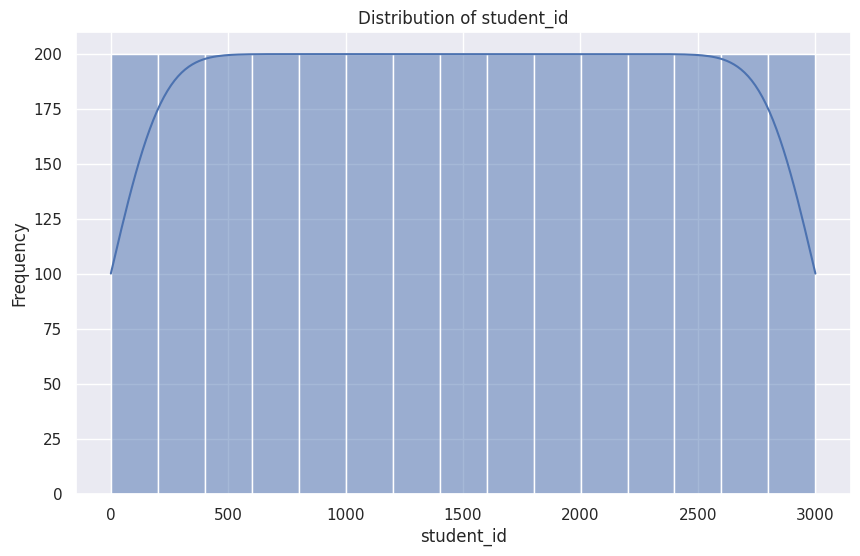

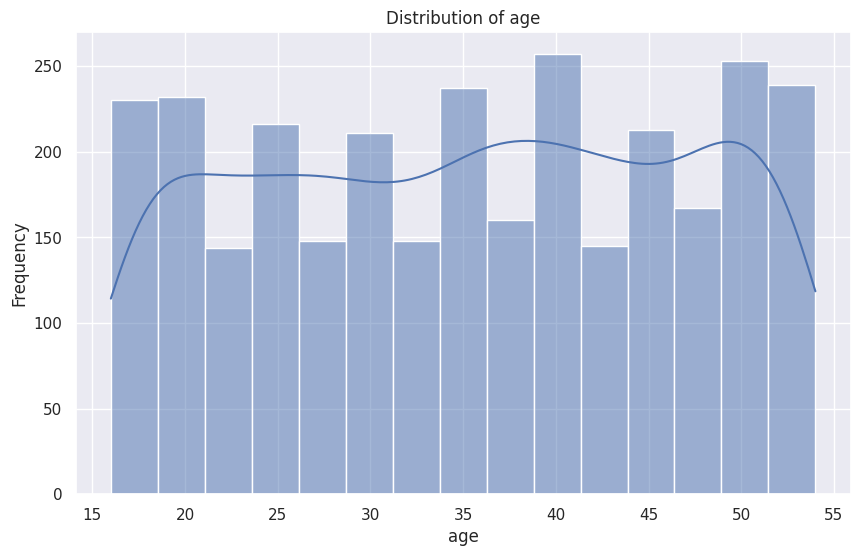

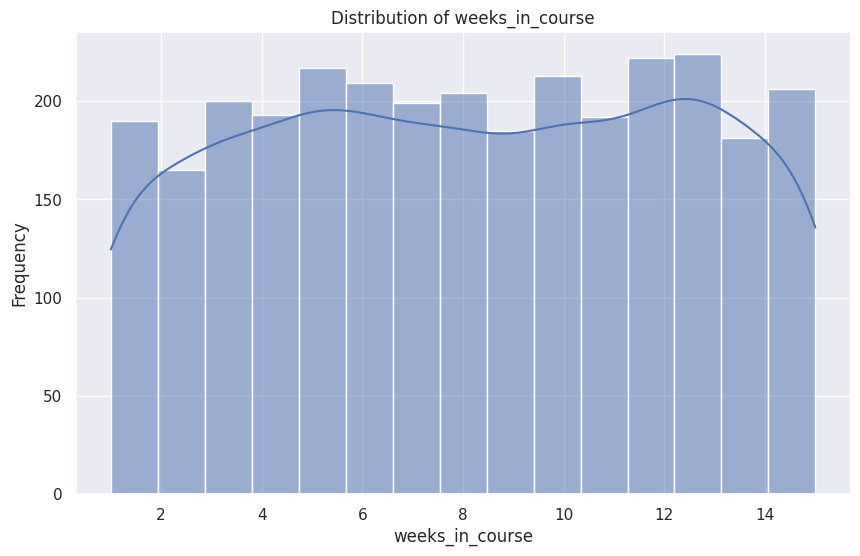

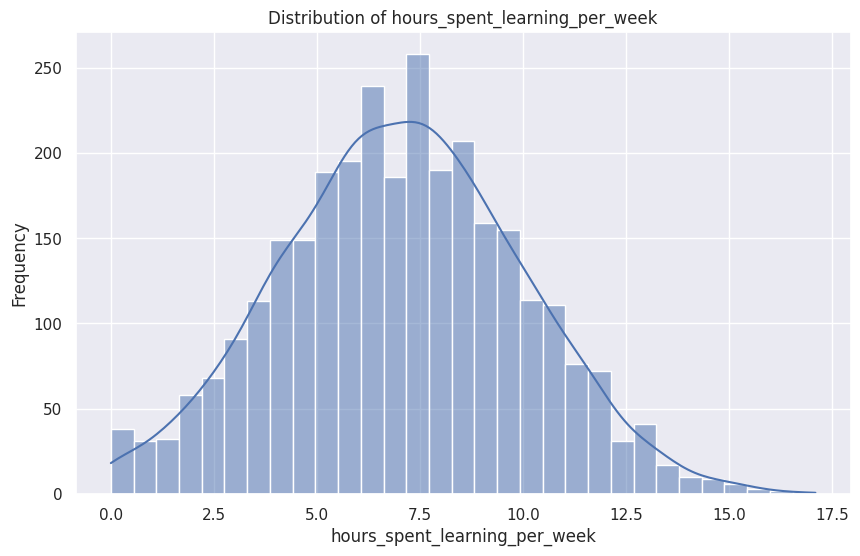

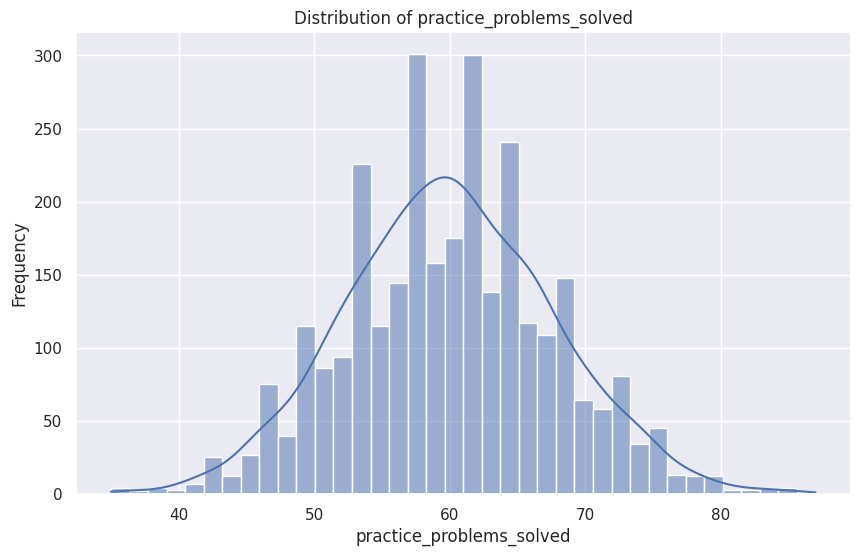

...

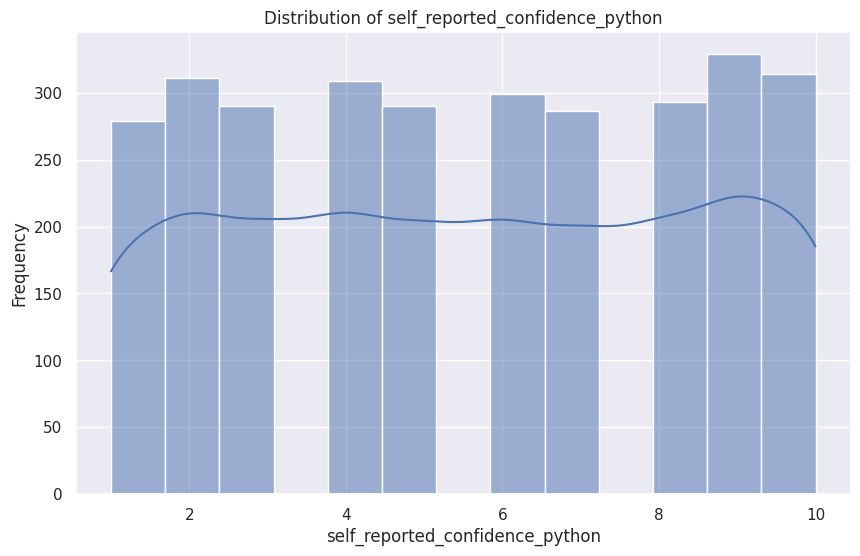

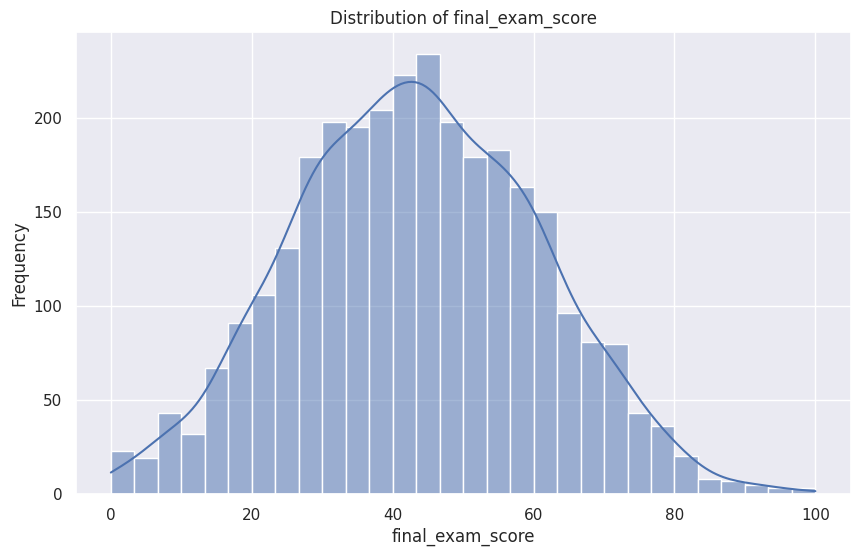

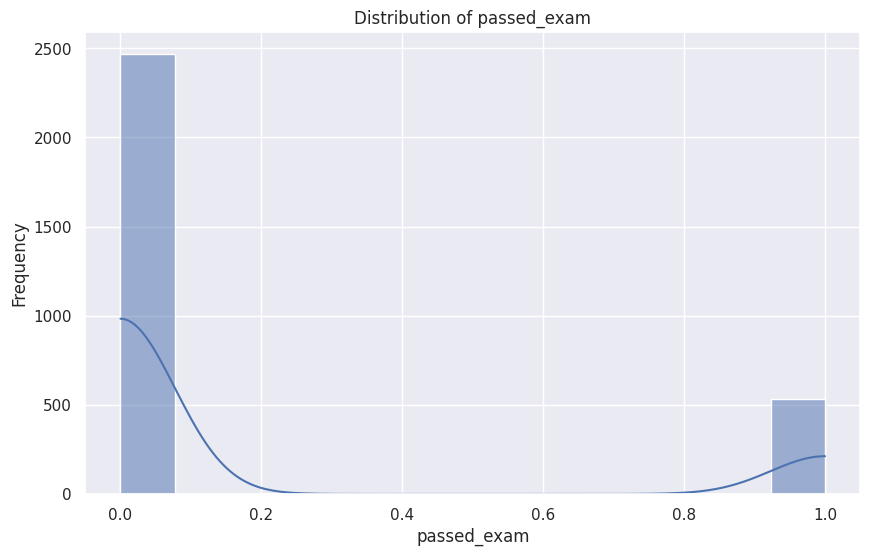

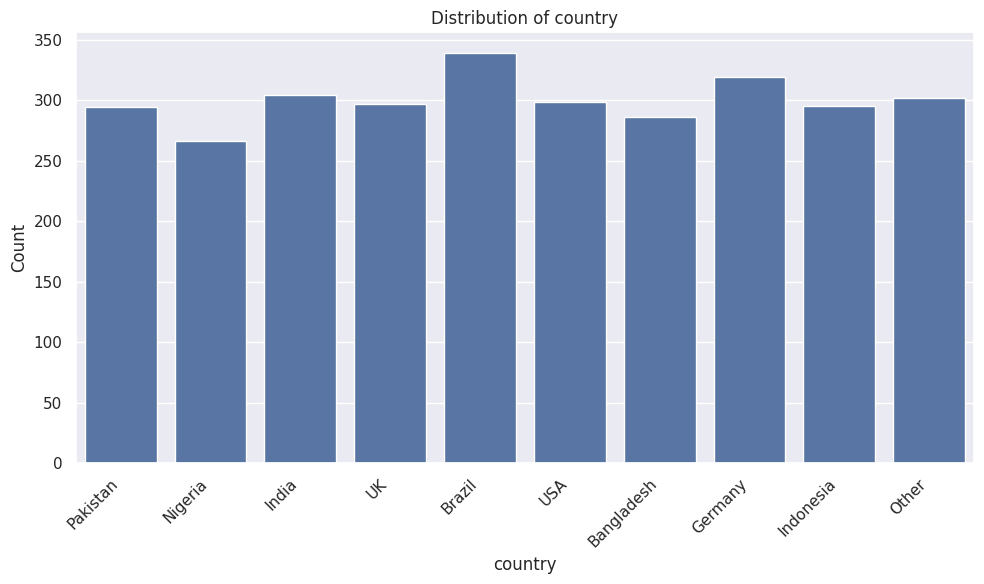

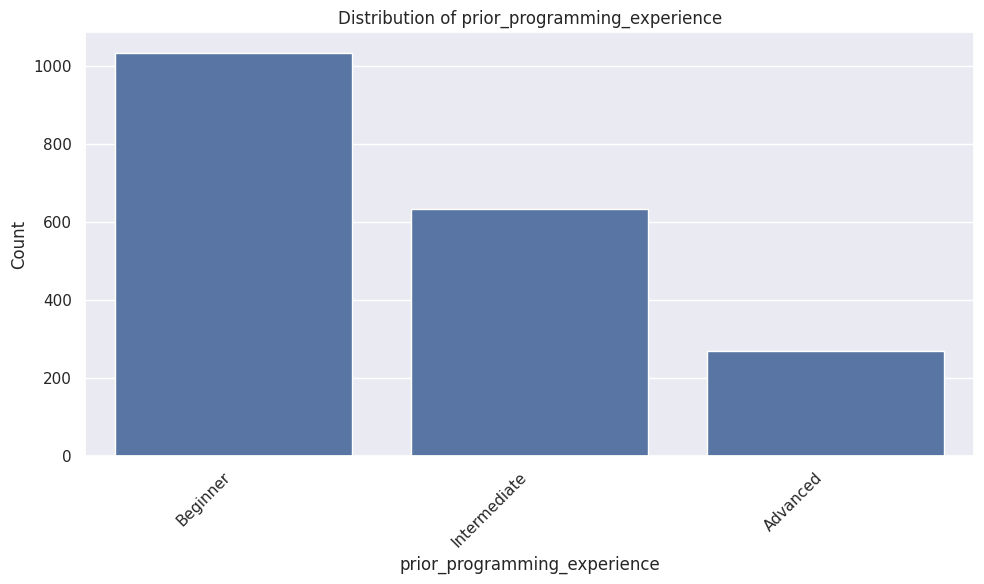

Value counts for country:
country
Brazil        339
Germany       319
India         304
Other         302
USA           298
UK            297
Indonesia     295
Pakistan      294
Bangladesh    286
Nigeria       266
Name: count, dtype: int64

Value counts for prior_programming_experience:
prior_programming_experience
Beginner        1034
Intermediate     634
Advanced         270
Name: count, dtype: int64



In [12]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

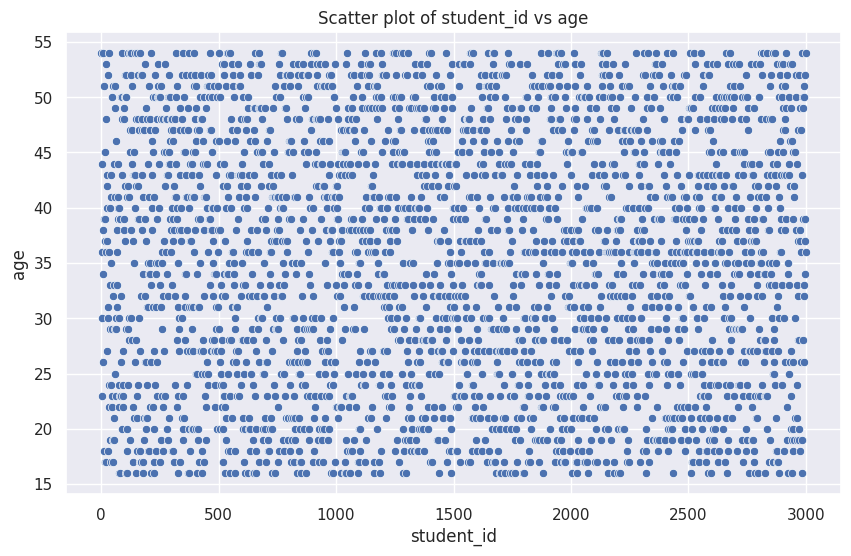

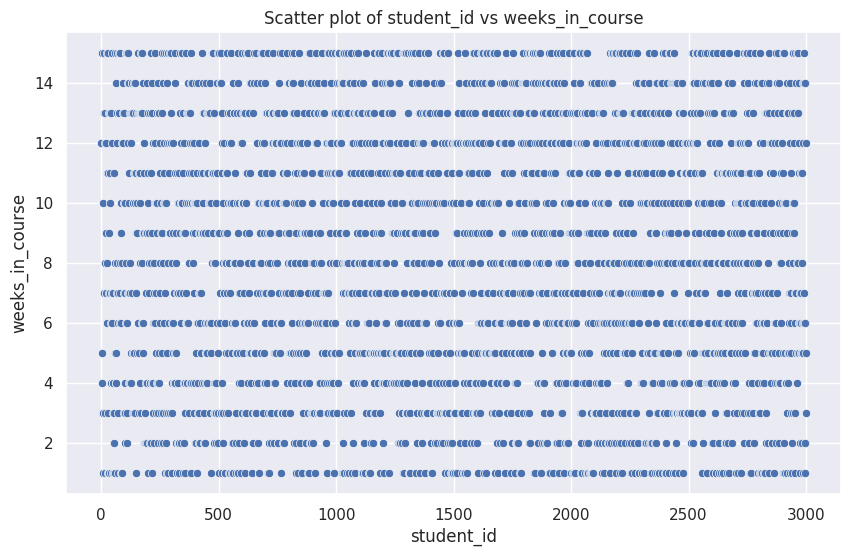

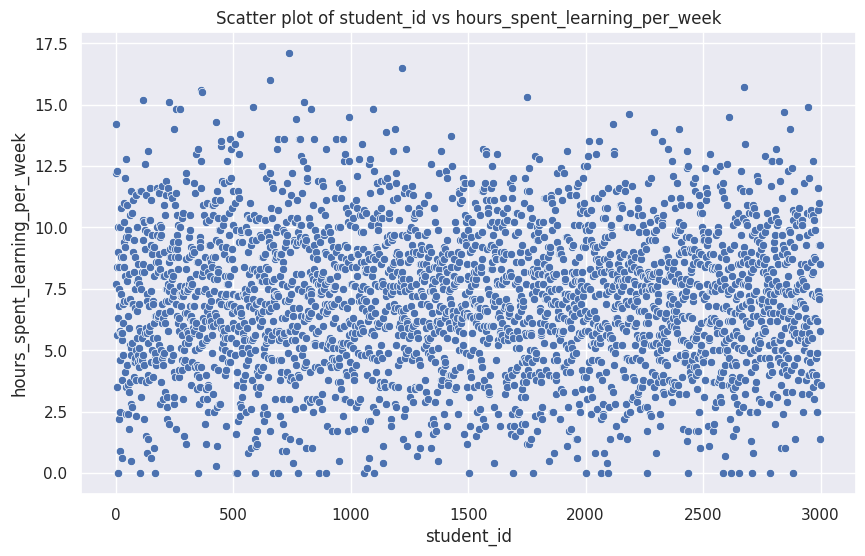

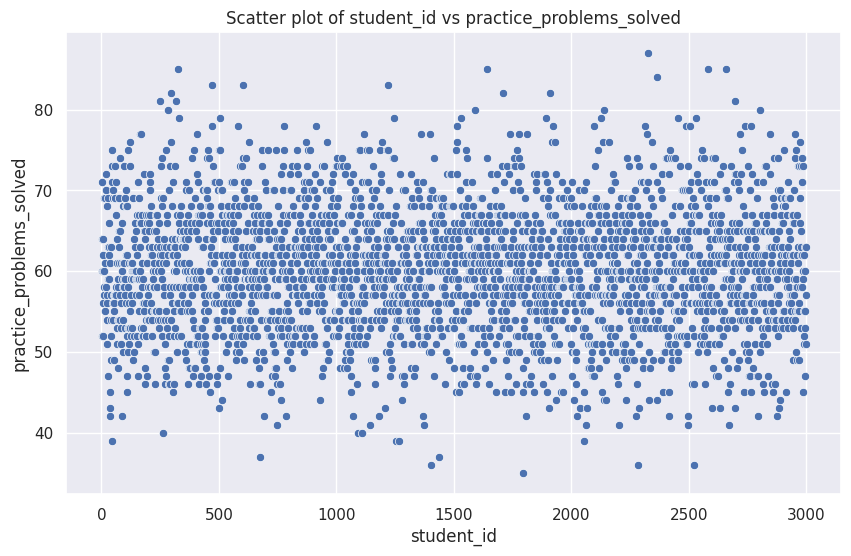

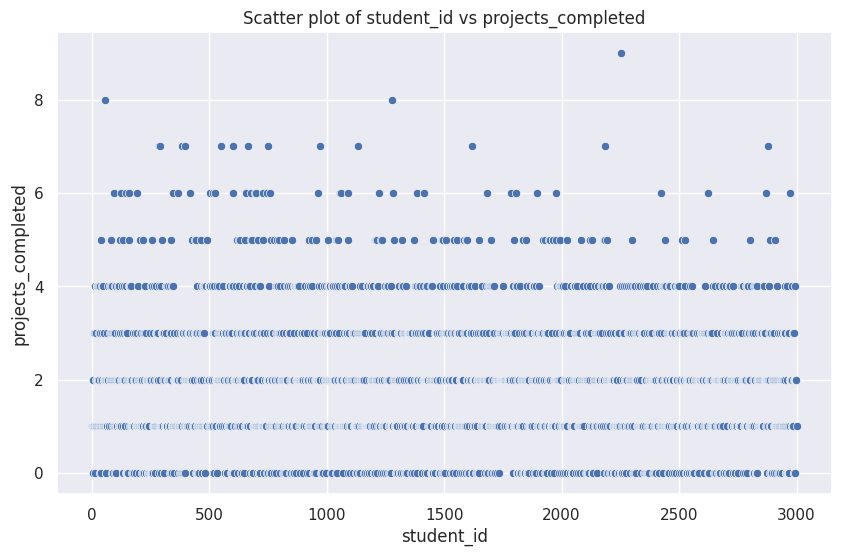

...

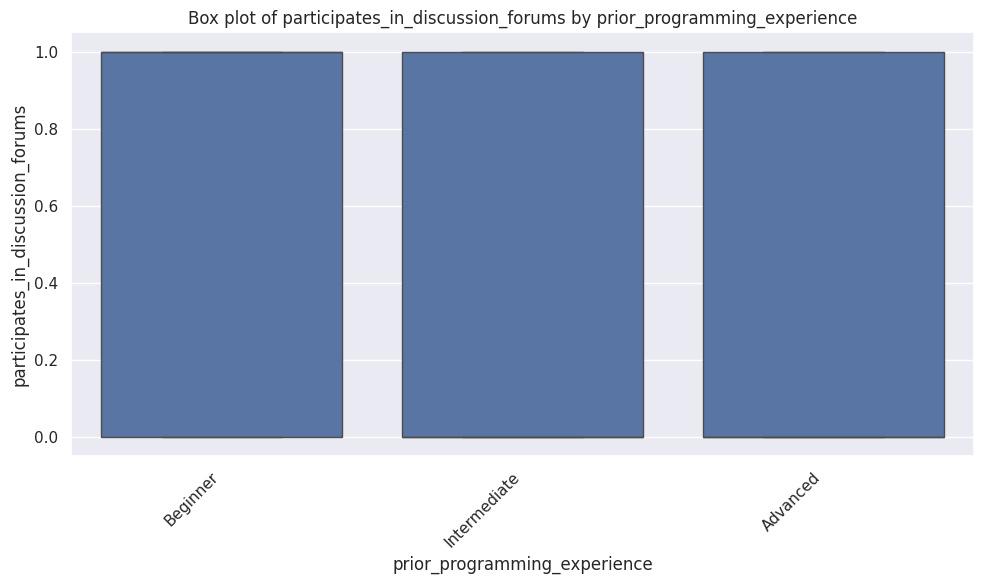

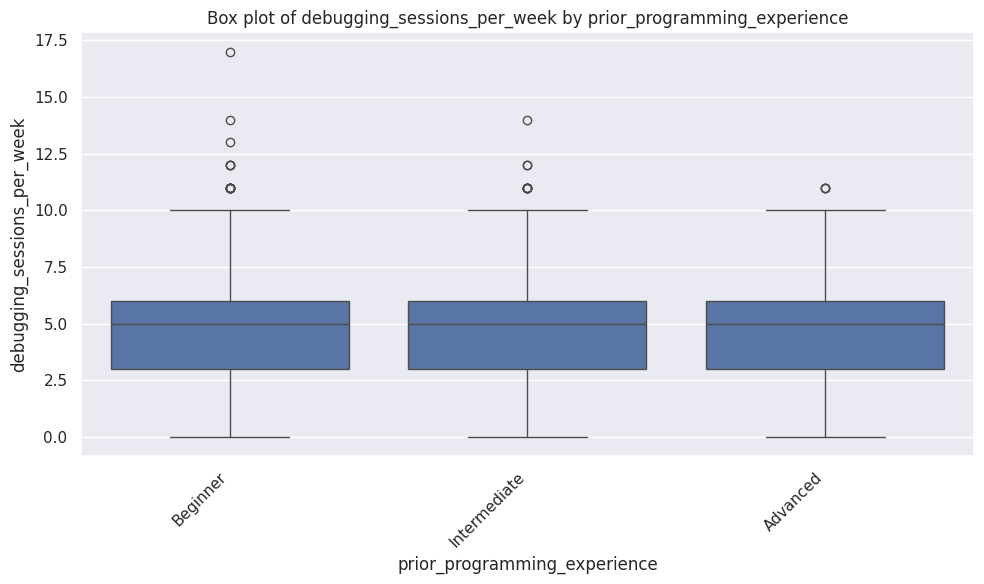

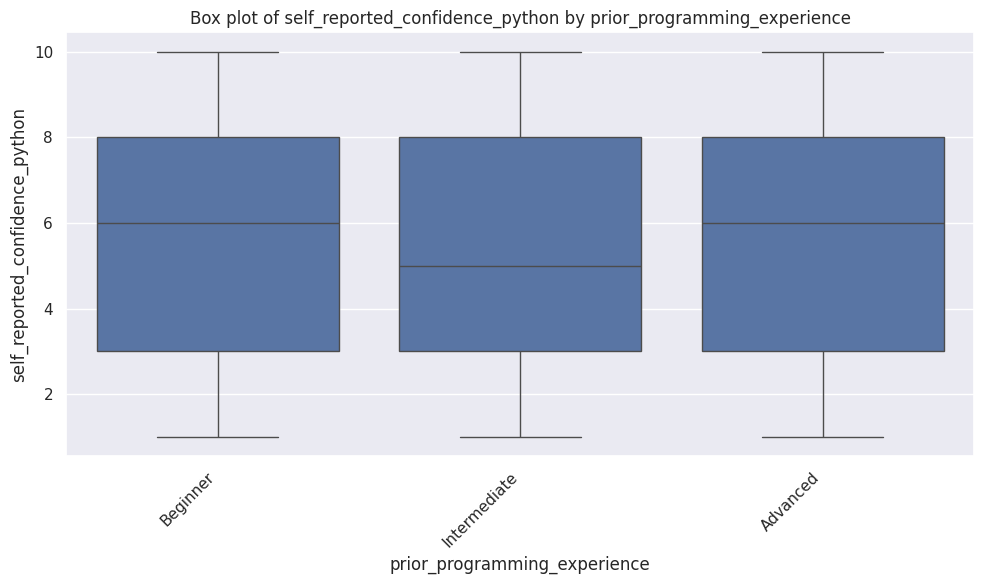

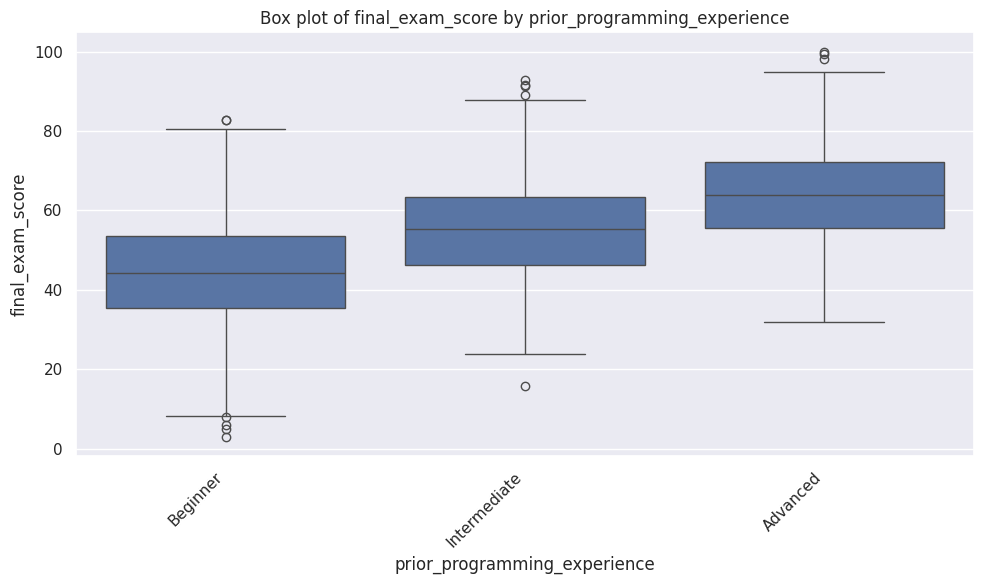

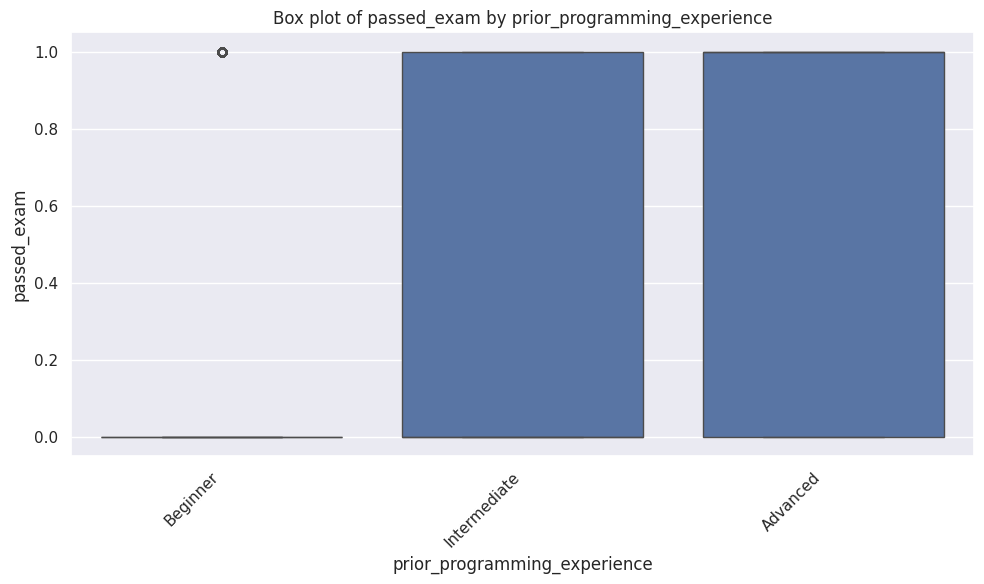

In [13]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

### Impact of Prior Programming Experience on Final Exam Score

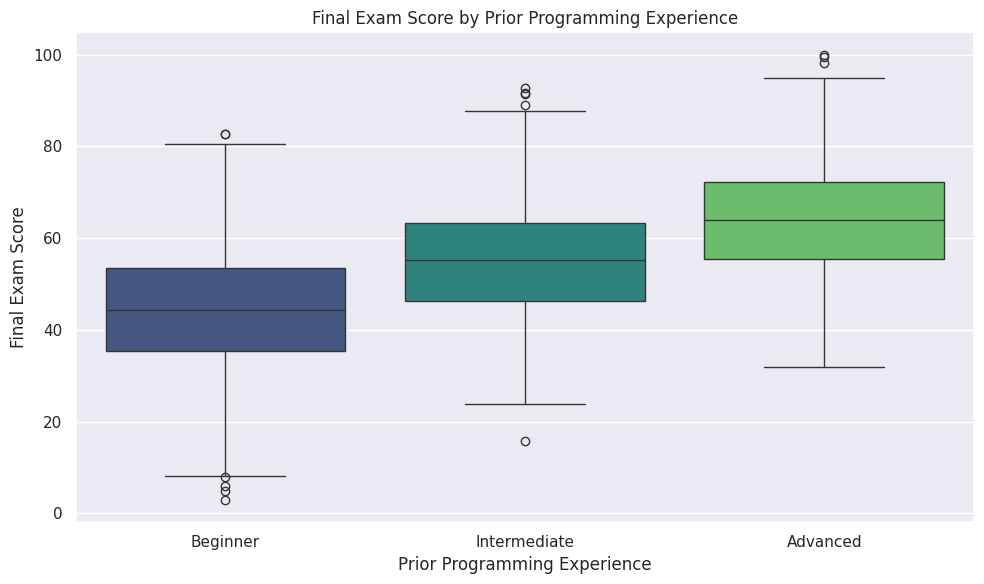

In [16]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='prior_programming_experience', y='final_exam_score', palette='viridis')
plt.title('Final Exam Score by Prior Programming Experience')
plt.xlabel('Prior Programming Experience')
plt.ylabel('Final Exam Score')
plt.tight_layout()
plt.show()

### Impact of Country on Final Exam Score

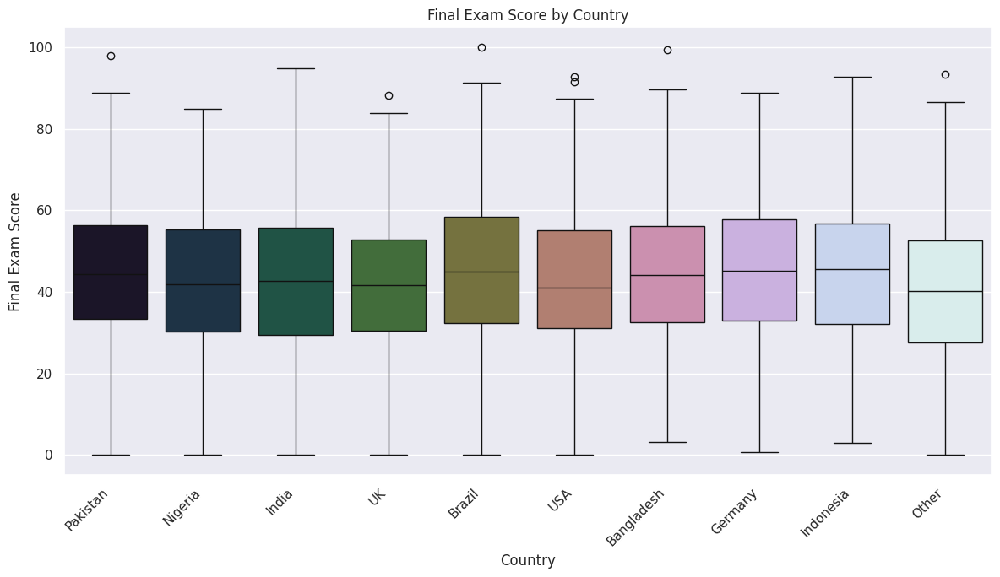

In [17]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=df, x='country', y='final_exam_score', palette='cubehelix')
plt.title('Final Exam Score by Country')
plt.xlabel('Country')
plt.ylabel('Final Exam Score')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Distribution of Final Exam Score for Passed vs. Failed Students

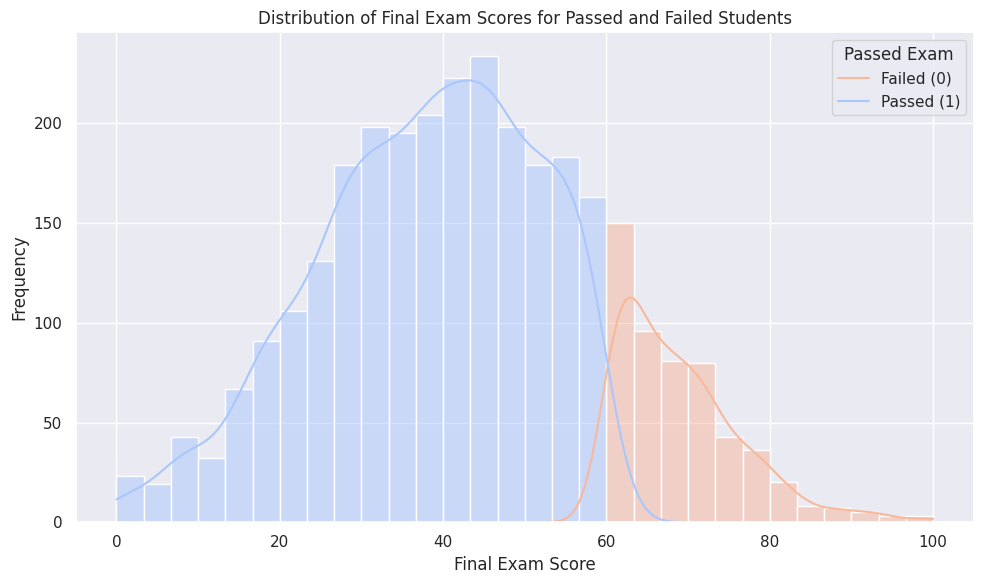

In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='final_exam_score', hue='passed_exam', kde=True, palette='coolwarm')
plt.title('Distribution of Final Exam Scores for Passed and Failed Students')
plt.xlabel('Final Exam Score')
plt.ylabel('Frequency')
plt.legend(title='Passed Exam', labels=['Failed (0)', 'Passed (1)'])
plt.tight_layout()
plt.show()

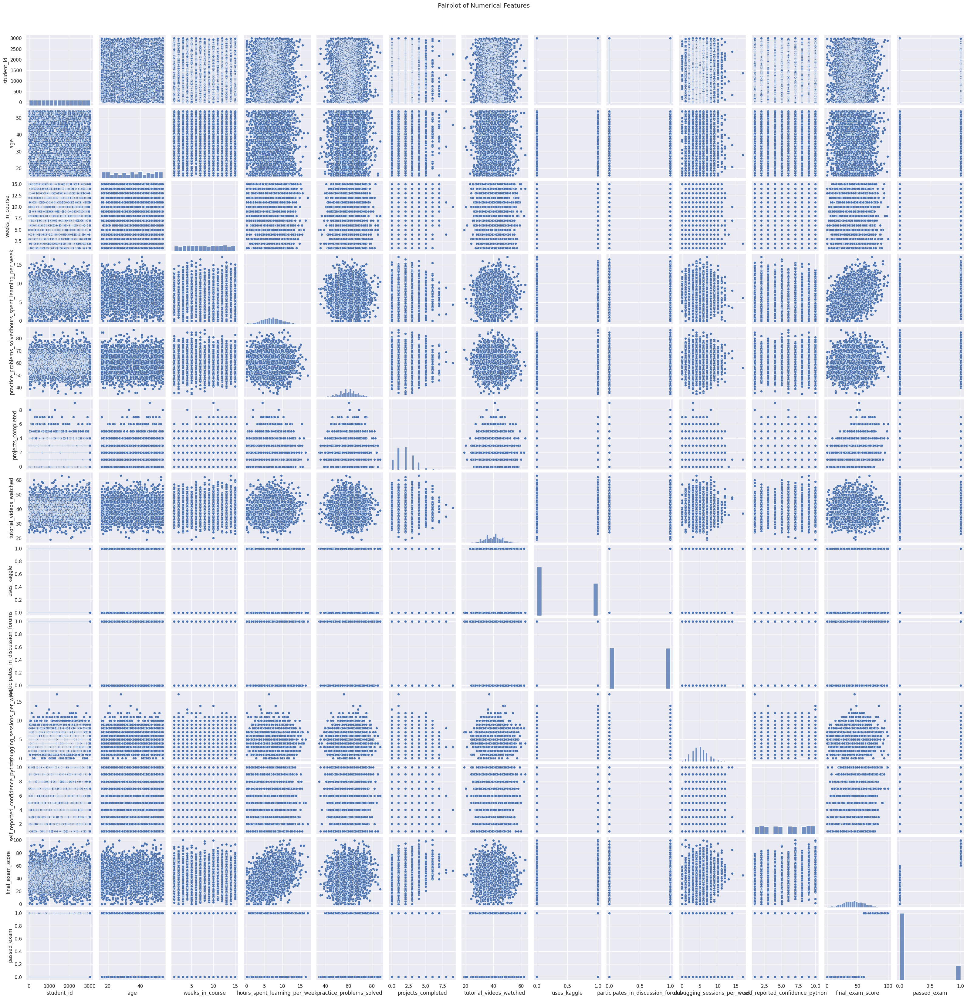

In [14]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

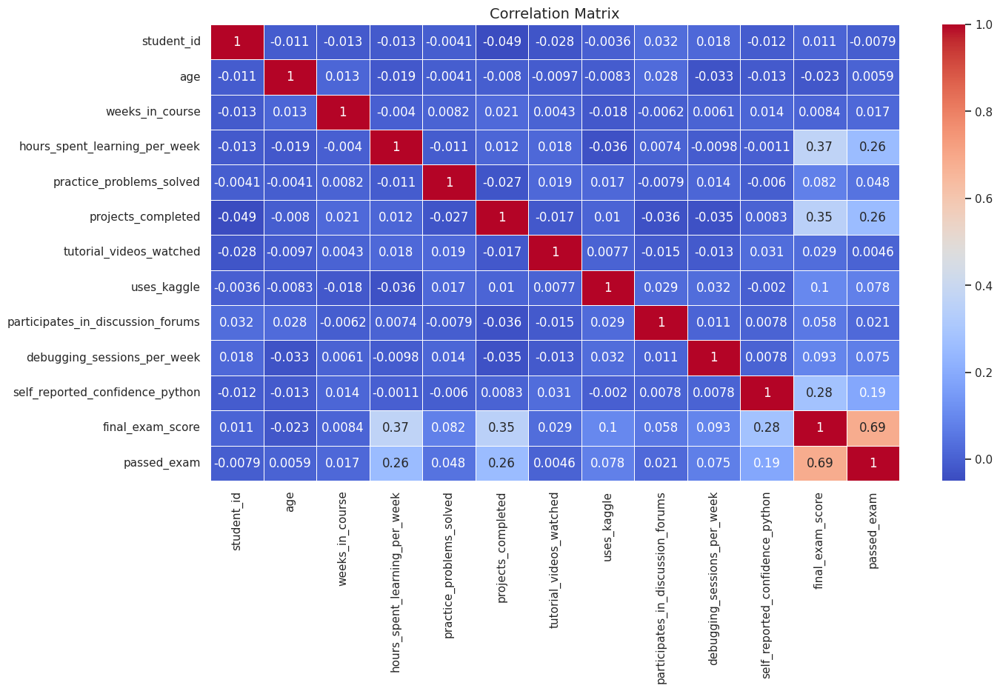

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You